<a href="https://colab.research.google.com/github/scottie1013/CNNs-tSNE/blob/main/Shihao_Wang_HW6_the_last_one.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 6 (The Last One)
# Lin. Alg. for Data Science. 
## Due date: hopefully a reasonable one, see discord



# Instructions:
0. Solve the tasks (by writing python code and answering extra questions). 
1. Prefix the name of the notebook with your name (e.g. Minecraft_Steve_HW3.ipynb)
2. Run all the cells in the notebook, so that all results are visible.

3. > Important: on colab create a shared link using the option **"for anyone with the link"** and switch permission from **Viewer** to **Editor**, so that it says "Anyone on the internet with the link can edit".

4. Submit the above link on canvas before the deadline. Do not modify the notebook after that.

5. The day after the final deadline, **you will be required to answer** some brief questions about your solution via a google form I will send you. This is part of the homework assignment! 

> This time I will also ask you to copy-paste some of your answers from this notebook to the form.


# Collaboration rules:
For this assignment, **you can do pretty much thatever you want**, discuss any aspect on discord etc. Perhaps except sharing the entire code, that'd be kind of pointless.

> Maybe also refrain from showing the resulting images -- I think it's nice if everyone sees their own output first. But feel free to share your results after everyone is done.



# Instructions
1. Solve the tasks by writing python code.
2. Fill in your name and the link to your shared notebook above. **Do make sure it's shared with 'anyone with the link' and clickable also when exported to pdf** 
3. Run all the cells, so that all results are visible.
4. Submit the link on canvas

Followup:
After the due date you will get a link to a brief survey in which you will answer a couple of questions about the work you did here.

# Overview

In HW3 we applied tSNE to the cifar(100) dataset. The resulting embedding did not really reflect the correct labels. We concluded that comparing the images using the Euclidean distance was not suffiecint to capture more intricate structures present in these images.

Now, we will apply tSNE to the feature vectors output by a Convolutional Neural Network (CNN). This should give us a much better embedding. 

The purpose of this assignment is to make sure you get some familiarity with keras. Also this is **not a typical scenario** for using neural networks -- but it makes a lot of sense to mix and match various tools. After all CNN returns a vector for each input image -- and we know many tools that take vectors.

We will use cifar10 dataset since it has fewer labels.

> I actually meant to use cifar10 for HW3 but somehow ended up using cifar100.



# Task 0

Load the cifar10 data.

> Remember that some networks like the efficientNet expect unnormalized images!

In [ ]:
from keras.datasets import cifar10

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
plt.rcParams["figure.figsize"] = (15,15)
from ipywidgets import *
import ipywidgets as widgets

In [ ]:
dataset = cifar10

In [ ]:
(x_train, y_train), (x_test, y_test) = dataset.load_data()
y_train_cat = keras.utils.to_categorical(y_train)
y_test_cat = keras.utils.to_categorical(y_test)


y_test = y_test.squeeze()
y_train = y_train.squeeze()

# Task 1

Build a **CNN** which accepts cifar10 images as input.

> Be smart about it! Remember the class on transfer learning. You can download a powerful network with one line of code! Overall, you can solve this task literally by deleting some lines from our notebook on transfer learning.

> If you use a network pre-trained on imagenet, make sure you need to reshape the data first -- we did it in the notebook. 

> If you use efficientNet remember it accepts unnormalized data -- so don't divide by 255!

> In the transfer learning notebook, we added an extra layer for classification -- you don't need it here!


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, Input

def build_model(num_classes):
    model = Sequential()
    
    model.add(Input(shape=(32, 32, 3)))

    model.add(layers.Lambda(lambda image: tf.image.resize(image, (224, 224)))) # ! just resizes the images to the expected size
    
    #model.add(img_augmentation) # !

    # include_top <= top as in top of the pyramid
    en = keras.applications.EfficientNetB0(include_top=False, weights="imagenet") # !
    en.trainable = False # ! DISABLE training of this entire layer (and all its components)

    model.add(en)    
    
    model.add(layers.GlobalAveragePooling2D()) # !
    model.add(layers.BatchNormalization())  # !
    model.add(layers.Dropout(0.15, name="top_dropout")) # !
    
    model.add(layers.Dense(num_classes, activation="softmax"))
  
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
    return model

In [ ]:
model = build_model(10)

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 batch_normalization_1 (Batc  (None, 1280)             5120      
 hNormalization)                                                 
                                                                 
 top_dropout (Dropout)       (None, 1280)              0         
                                                                 
 dense_1 (Dense)             (None, 10)               

# Task 2

Feed the entire **test data** through the feature extraction part of the network.

> Use the **predict** function/method to get your output vectors. 

> Wait -- shouldn't I first fit/train the network with training data?? Think about it -- and feel free to discuss on discord if in doubt!

> If your network is meant for classification, make sure not to take the final predictions (class probabilities). Take the input of the layer which would normally be fed into the MLP. (This can be confusing since the method is called predict.) 

> In the notebook on CNNs I showed you how to get the ouput of a selected layer. You can just use that.



In [ ]:
layer_to_look_at = 4
inp = model.input
out = model.layers[layer_to_look_at].output
submodel = keras.Model(inputs = [inp], outputs = [out])

output = submodel.predict(x_test)

313/313 [==============================] - 17s 52ms/step


# Task 3

Apply tSNE to the resulting vectors as usual.

> It's 10k vectors, it should take a minute or so.

In [ ]:
num_iters = 1500 # PARAM
perplexity = 30 # PARAM
my_random_state = 0 # PARAM
learning_rate = 300 # PARAM
tsne = TSNE(n_components = 2, n_iter = num_iters, 
            perplexity = perplexity, random_state = my_random_state,
            learning_rate = learning_rate, init = 'random')
vis_data = tsne.fit_transform(output)

# Task 4

Visualize the tSNE output using a 2-dimensional scatterplot, color point depending on the correct label.

> The labels[i] corresponds to the i-th class as specified by y_train. In particular it means that images with correct label = 0 are 'airplanes'.

You can use these labels in scatterplot by specifying the $label$ parameter, similar to what we did with colors. I'd use both colors and labels. If you say plt.legend(), you'll see what color corresponds to which label. E.g. red may be 'airplanes' etc.

See discussion here: https://discord.com/channels/1013874739430834229/1049833676818616370/1051318821178318898

> You should get decent grouping which reflects the classes well.

> What kind of classes/labels are most often confused? Just have a look.

I noticed that images that share multiple properties are most often confused instead of just sharing a similar color. for example, trucks and cars are mostly confused here because they all have wheels, doors, front lights and so on, same goes for cats and dogs(all animals with similar shapes). This means with the help of neural network, we are able to recognize more nuances in images and we are able train them to help better classify images. This is not something a brute force dimension reduction like Tsne can easily achieve.

In [ ]:
# I prepared the cifar10 labels for you -- see, I'm not a bad person!
labels = np.array('airplanes,cars,birds,cats,deer,dogs,frogs,horses,ships,trucks'.split(','))

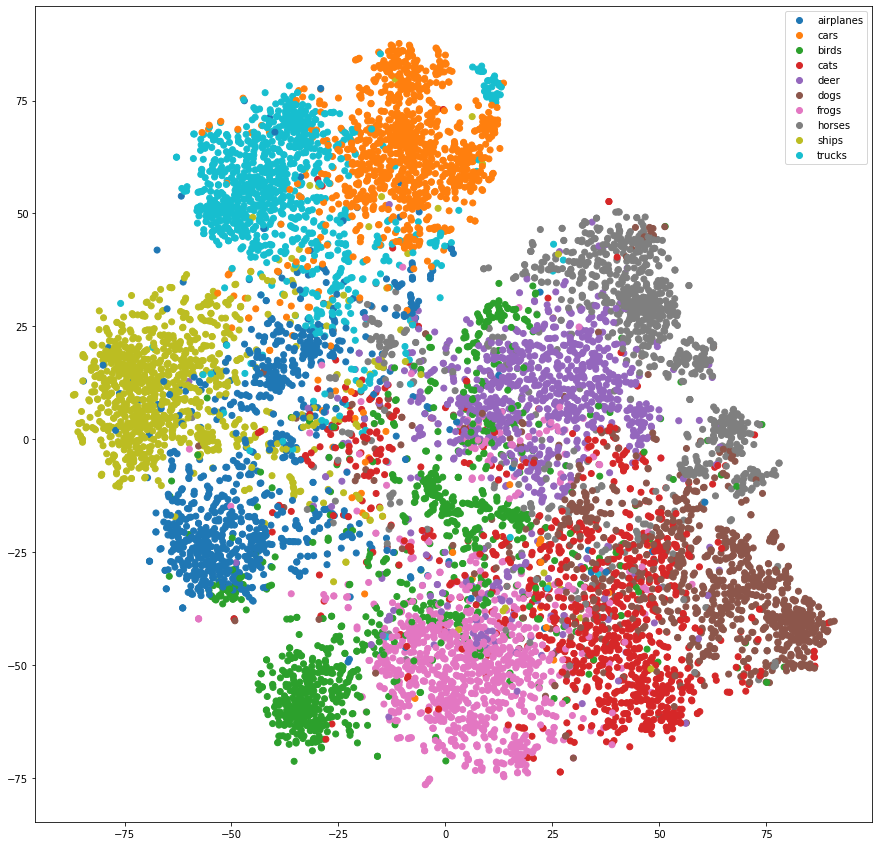

In [ ]:
np.random.seed(0)
scatter = plt.scatter(*vis_data.T, c=y_test, cmap='tab10')
plt.legend(scatter.legend_elements()[0], labels)
plt.show()

# Task 5

Visualize the tSNE output using a scatterplot, but this time show the image corresponding to each point.

> You should see nice structure. It should be clear that -- unlike HW3 -- it's no longer about color. 

> Enjoy the view!

In [ ]:
def plot_image_at_point(im, xy, zoom = 1):    
  dxy = np.random.rand(2)/100 * plt.ylim()
  plt.arrow(*xy, *dxy)
  ab = AnnotationBbox(OffsetImage(im, zoom=zoom, cmap = 'gray_r'), xy + dxy, frameon=False)
  plt.gca().add_artist(ab)

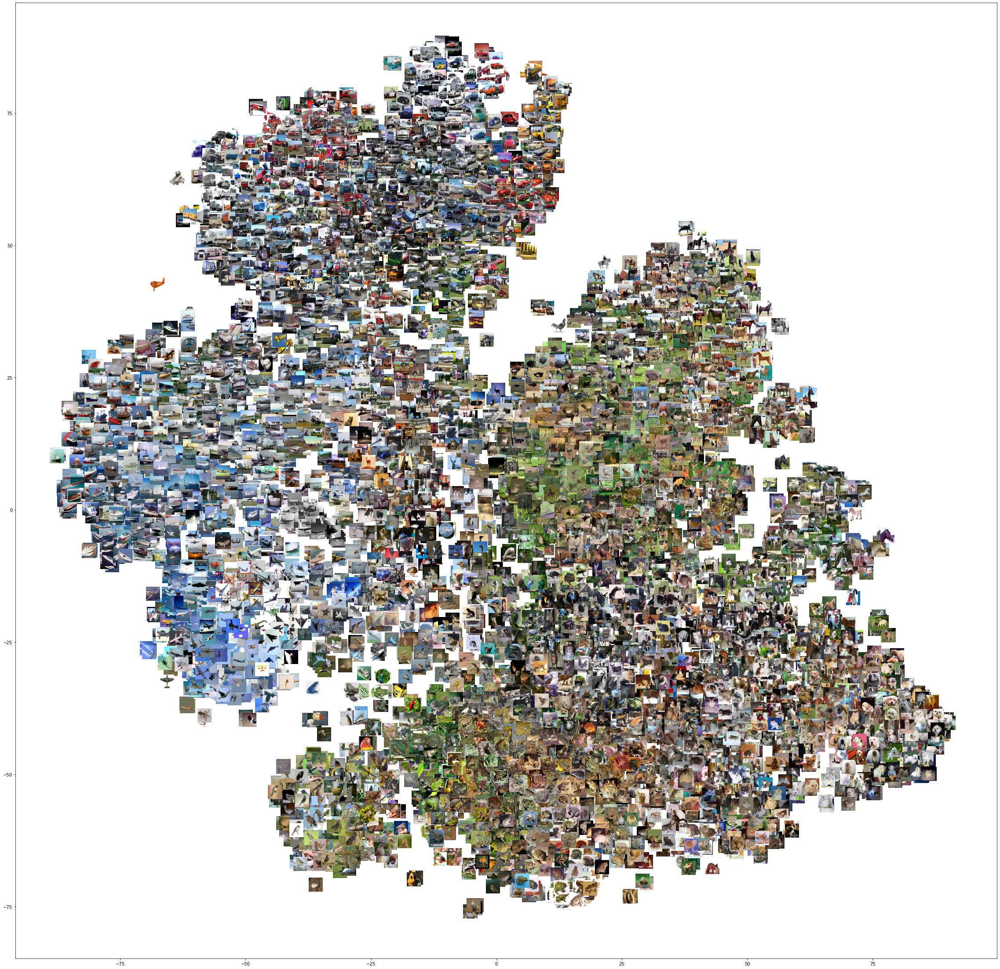

In [ ]:
np.random.seed(0)
plt.figure(figsize = (40,40)) 

plt.scatter(vis_data.T[0], vis_data.T[1])

image_zoom = 1.0 # controls the size of plotted inmages

for im, xy in zip(x_test, vis_data):
  plot_image_at_point(im, xy, image_zoom)

# Bonus

Use a network fine-tuned to cifar10 and repeat the 2 tSNE plots -- you should see even clearer separation into classes.

> In this case you'll actually have to train/fit the network on the train dataset. You will have to carefully unfreeze some of the layers -- there is code for that in the notebook, so that's no sectet.

> Note that in this case we cannot say we do unsupervised learning. 

Indeed the separation are so much clearer!

In [ ]:
#before fine-tunning
model.fit(x_train, y_train_cat, batch_size = 256, epochs = 2, validation_data = (x_test, y_test_cat)) 

Epoch 1/2
196/196 [==============================] - 106s 512ms/step - loss: 0.5685 - accuracy: 0.8445 - val_loss: 0.3574 - val_accuracy: 0.8771
Epoch 2/2
196/196 [==============================] - 100s 512ms/step - loss: 0.4177 - accuracy: 0.8735 - val_loss: 0.3265 - val_accuracy: 0.8920


In [ ]:
def unfreeze_effnet(model, num_top_layers):
    effnet = model.get_layer('efficientnetb0')    
    
    effnet.trainable = True
    
    # double check all are non-trainable, in case someone unfroze it multiple times
    # with different parameters
    for layer in effnet.layers[:]:
        layer.trainable = False    
    
    # unfreeze the top 
    for layer in effnet.layers[:num_top_layers]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True            

    nontr = sum([not layer.trainable for layer in effnet.layers])
    
    print(f"non-trainable layers left: {nontr}")                

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(optimizer=optimizer, 
                  loss="categorical_crossentropy", metrics=["accuracy"])    


unfreeze_effnet(model, 160)

model.summary()

non-trainable layers left: 110
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 batch_normalization_1 (Batc  (None, 1280)             5120      
 hNormalization)                                                 
                                                                 
 top_dropout (Dropout)       (None, 1280)              0         
                                                                 
 dense_1 (Dense)       

In [ ]:
epochs = 2
hist = model.fit(x_train, y_train_cat, epochs=epochs, validation_data=(x_test, y_test_cat), verbose=1)

Epoch 1/2
1563/1563 [==============================] - 519s 327ms/step - loss: 0.2516 - accuracy: 0.9222 - val_loss: 0.1618 - val_accuracy: 0.9471
Epoch 2/2
1563/1563 [==============================] - 507s 325ms/step - loss: 0.1696 - accuracy: 0.9455 - val_loss: 0.1555 - val_accuracy: 0.9545


In [ ]:
model.evaluate(x_test, y_test_cat)

313/313 [==============================] - 18s 59ms/step - loss: 0.1555 - accuracy: 0.9545


[0.155510812997818, 0.9545000195503235]

In [ ]:
model.evaluate(x_train, y_train_cat)

1563/1563 [==============================] - 92s 59ms/step - loss: 0.0792 - accuracy: 0.9736


[0.07922237366437912, 0.973580002784729]

In [ ]:
layer_to_look_at = 4
inp = model.input
out = model.layers[layer_to_look_at].output
submodel = keras.Model(inputs = [inp], outputs = [out])

output = submodel.predict(x_test)

313/313 [==============================] - 18s 53ms/step


In [ ]:
tsne = TSNE(n_components=2, random_state=0)
vis_data = tsne.fit_transform(output)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


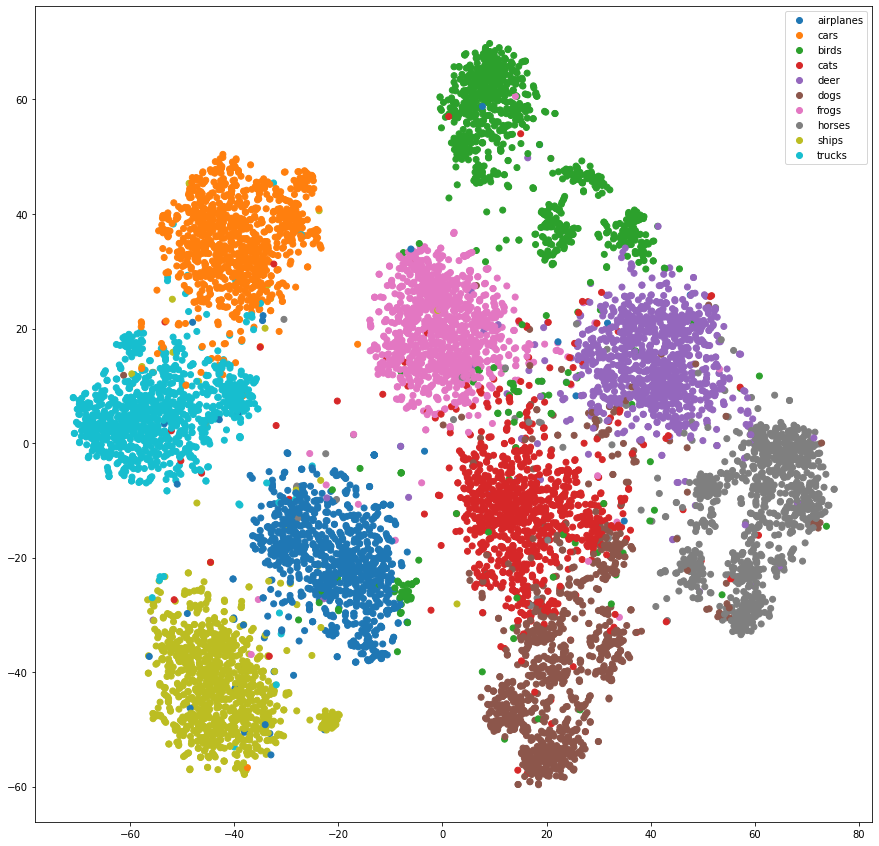

In [ ]:
np.random.seed(0)
scatter = plt.scatter(*vis_data.T, c=y_test, cmap='tab10')
plt.legend(scatter.legend_elements()[0], labels)
plt.show()

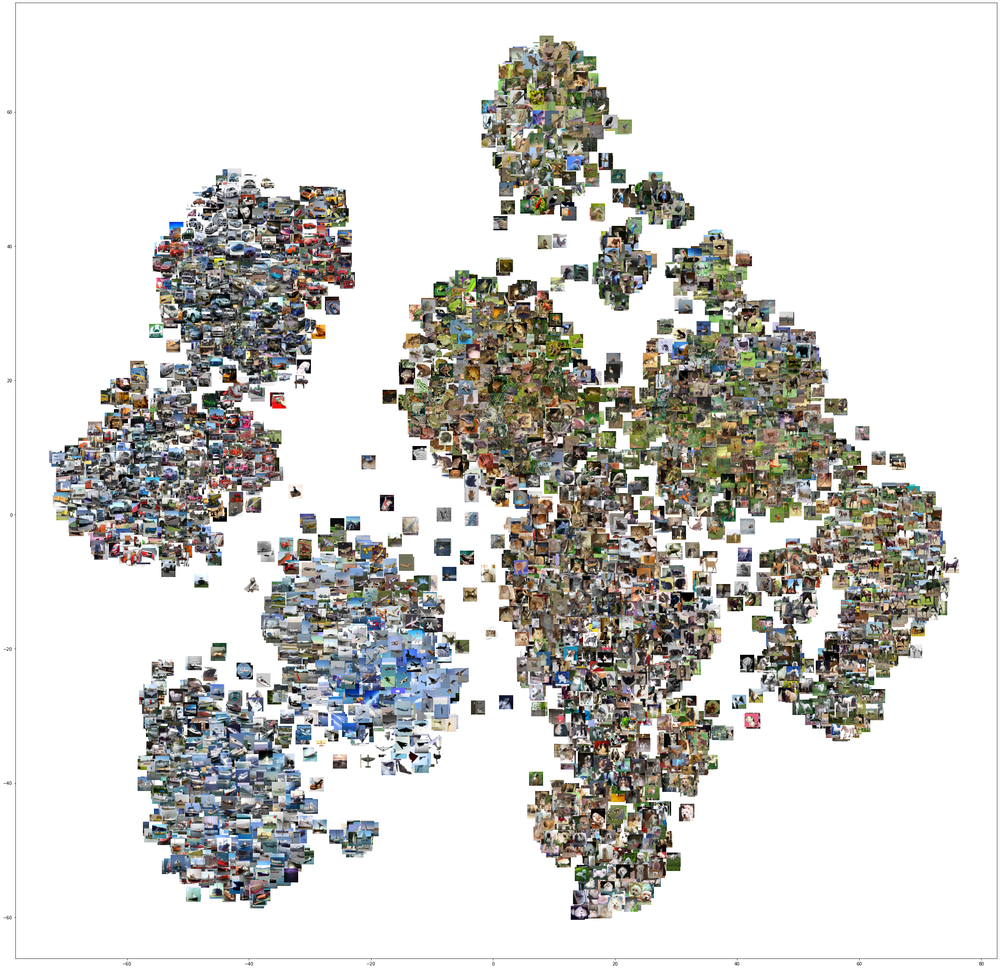

In [ ]:
np.random.seed(0)
plt.figure(figsize = (40,40)) 

plt.scatter(vis_data.T[0], vis_data.T[1])

image_zoom = 1.0 # controls the size of plotted inmages

for im, xy in zip(x_test, vis_data):
  plot_image_at_point(im, xy, image_zoom)